In [1]:
%load_ext pretty_jupyter

In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

from datetime import date
import hisepy
import numpy as np
import os
import pandas as pd
import re
import scanpy as sc

## Helper functions

In [3]:
def cache_uuid_path(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    if not os.path.isdir(cache_path):
        hise_res = hisepy.reader.cache_files([uuid])
    filename = os.listdir(cache_path)[0]
    cache_file = '{p}/{f}'.format(p = cache_path, f = filename)
    return cache_file

In [4]:
def read_csv_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_csv(cache_file)
    return res

In [5]:
def read_parquet_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_parquet(cache_file)
    return res

In [6]:
def read_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file)
    return res

In [7]:
def backed_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file, backed = 'r')
    return res

In [8]:
def rm_cache_uuid(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    rm_call = 'rm -r {d}'.format(d = cache_path)
    os.system(rm_call)

In [9]:
def format_cell_type(cell_type):
    cell_type = re.sub('\\+', 'pos', cell_type)
    cell_type = re.sub('-', 'neg', cell_type)
    cell_type = re.sub(' ', '_', cell_type)
    return cell_type

In [10]:
def filename_cell_type(filename):
    cell_type = re.sub('.+L3_','',filename)
    cell_type = re.sub('_2024.+','',cell_type)
    cell_type = re.sub('_', ' ', cell_type)
    cell_type = re.sub('pos','+', cell_type)
    cell_type = re.sub('neg','-', cell_type)
    return cell_type

In [11]:
def add_labels(adata, labels):
    obs = adata.obs
    obs = obs.reset_index(drop = True)
    obs = obs.merge(labels, on = 'barcodes', how = 'left')
    obs = obs.set_index('barcodes', drop = False)
    adata.obs = obs
    return adata

In [12]:
def element_id(n = 3):
    import periodictable
    from random import randrange
    rand_el = []
    for i in range(n):
        el = randrange(0,118)
        rand_el.append(periodictable.elements[el].name)
    rand_str = '-'.join(rand_el)
    return rand_str

## Markers for dotplots

In [13]:
broad_markers = [
    'CD3D', # T cells
    'CD3E', # T cells/NK
    'FCN1', # Monocytes/Myeloid
    'HBB', # Erythrocytes
    'IL7R', # T cells
    'MS4A1', # B cells
    'CD79A', # B cells
    'PPBP', # Platelets
    'IFI44L' # ISG-high
]

In [14]:
class_markers = [
    'FCGR3A', # CD16+ cells
    'GZMB',
    'GZMK',   # GZMK+ (between CD56hi and CD56dim)
    'IFI44L', # ISG-high
    'NCAM1',  # CD56
    'PTMS'    # Some adaptive NK
]

## Read previous, non-tracked labels
We ran a preliminary analysis of our dataset that wasn't tracked for reproducibility. Here, we'll retrieve the labels for visualization and comparison to check for consistency.

In [15]:
original_uuid = '3868592c-0087-4ed8-98b2-4bf1b8676111'
original_df = read_parquet_uuid(original_uuid)
original_df = original_df[['barcodes', 'AIFI_L1', 'AIFI_L2', 'AIFI_L3']]
original_df = original_df.rename({'AIFI_L1': 'original_L1', 'AIFI_L2': 'original_L2', 'AIFI_L3': 'original_L3'}, axis = 1)

In [16]:
original_df.head()

,barcodes,original_L1,original_L2,original_L3
0,05ea9806794211eb93b836d1cb6129eb,DC,cDC1,cDC1
1,e225c914794011eb9282e2ceeb91ba52,DC,cDC1,cDC1
2,b1379eae795411eb958b0245821e6993,DC,cDC1,cDC1
3,b13d3a8a795411eb958b0245821e6993,DC,cDC1,cDC1
4,b1430d16795411eb958b0245821e6993,DC,cDC1,cDC1


## Read cell type hierarchy

In [17]:
hierarchy_uuid = '1a44252c-8cab-4c8f-92c9-d8f3af633790'
hierarchy_df = read_csv_uuid(hierarchy_uuid)

## Identify files for use in HISE

In [18]:
search_id = 'californium-tin-oxygen'

Retrieve files stored in our HISE project store

In [19]:
ps_df = hisepy.list_files_in_project_store('cohorts')
ps_df = ps_df[['id', 'name']]

Filter for files from the previous notebook using our search_id

In [20]:
search_df = ps_df[ps_df['name'].str.contains(search_id)]
search_df = search_df.sort_values('name')
search_df['AIFI_L3'] = [filename_cell_type(f) for f in search_df['name']]

In [21]:
search_df['AIFI_L3'].tolist()

['Adaptive NK cell',
 'CD56bright NK cell',
 'GZMK- CD56dim NK cell',
 'GZMK+ CD56dim NK cell',
 'ILC',
 'ISG+ CD56dim NK cell',
 'Proliferating NK cell']

## Review Adaptive NK cell

In [22]:
cell_type = 'Adaptive NK cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [23]:
type_uuid

'68091bf3-85b6-4ed4-80b2-601646da6533'

In [24]:
adata = read_adata_uuid(type_uuid)

### Clustering

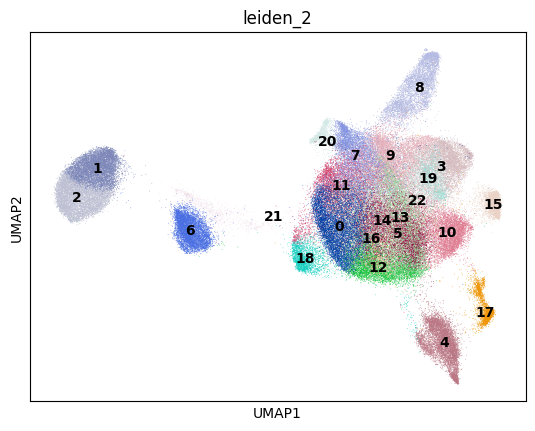

In [25]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

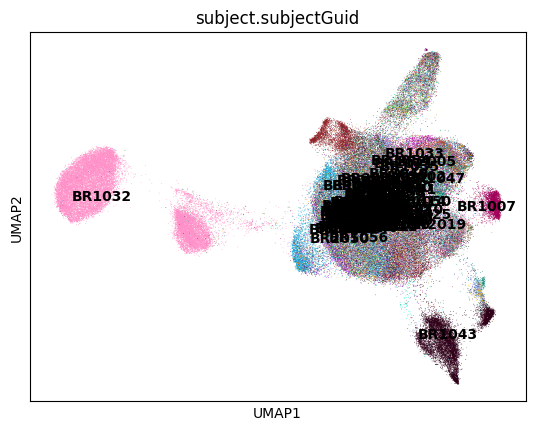

In [26]:
sc.pl.umap(adata, color = 'subject.subjectGuid', legend_loc = 'on data')

### Marker expression

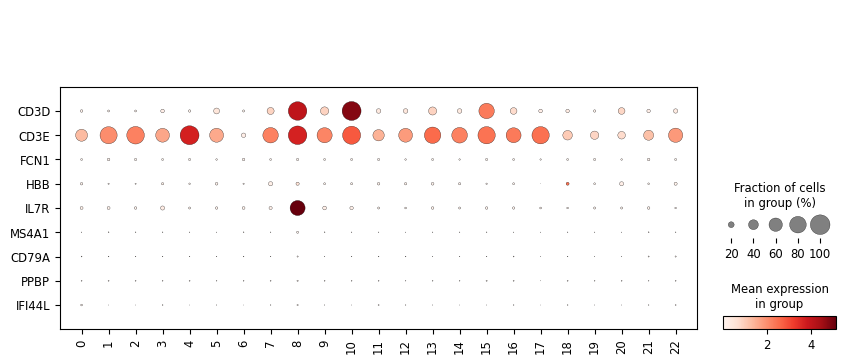

In [27]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

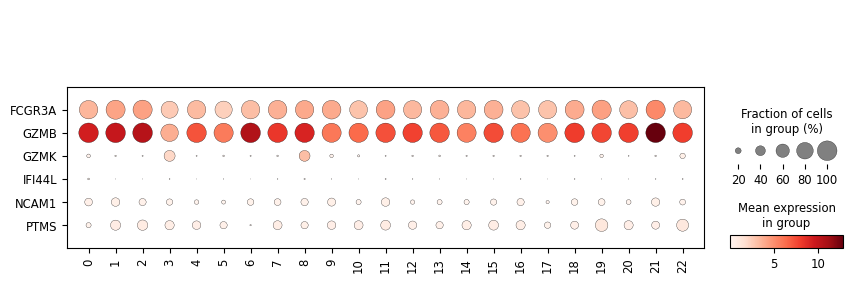

In [28]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Cluster counts

In [29]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     8829
1     7838
2     7823
3     7425
4     7235
5     6558
6     6320
7     5931
8     5768
9     5615
10    5565
11    5029
12    4643
13    3888
14    3798
15    3142
16    3127
17    2983
18    2549
19    2428
20    2067
21    1777
22     165
Name: count, dtype: int64

### Outlier investigation

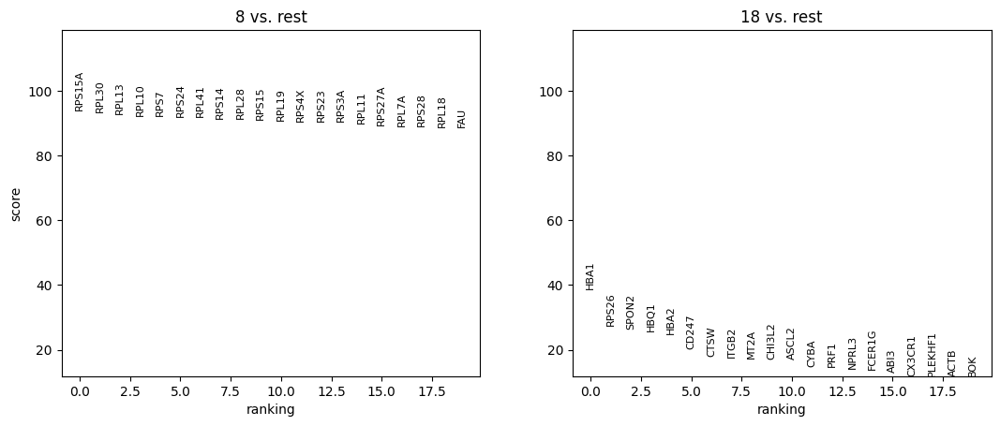

In [30]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['8','18']
)
sc.pl.rank_genes_groups(adata)

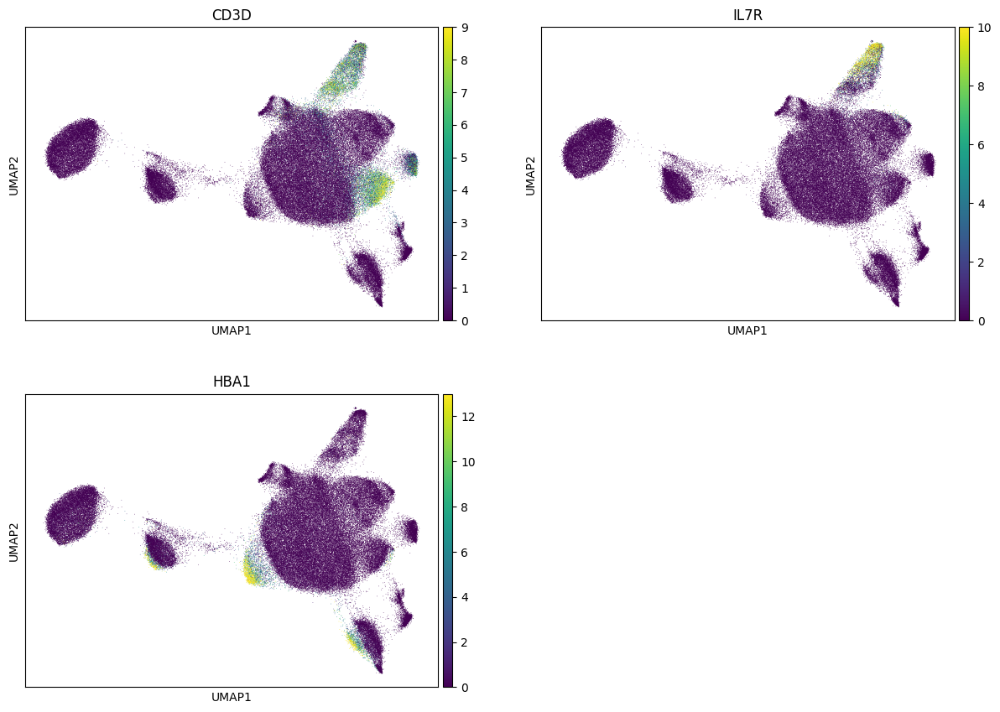

In [31]:
sc.pl.umap(adata, color = ['CD3D', 'IL7R', 'HBA1'], vmax = 'p99', ncols = 2)

### Comparison to original labels

In [32]:
adata = add_labels(adata, original_df)

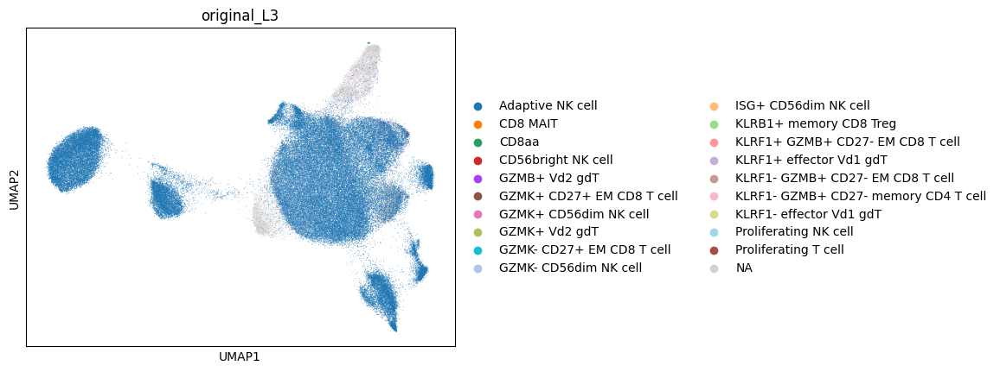

In [33]:
sc.pl.umap(adata, color = 'original_L3')

In [34]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Adaptive NK cell                        93100
NaN                                      9982
GZMK- CD56dim NK cell                    4159
KLRF1+ effector Vd1 gdT                   881
KLRF1- GZMB+ CD27- EM CD8 T cell          561
KLRF1- effector Vd1 gdT                   418
GZMB+ Vd2 gdT                             386
GZMK+ CD56dim NK cell                     353
KLRF1+ GZMB+ CD27- EM CD8 T cell          310
CD56bright NK cell                        151
ISG+ CD56dim NK cell                       99
Proliferating NK cell                      59
KLRF1- GZMB+ CD27- memory CD4 T cell       24
CD8aa                                       7
GZMK+ CD27+ EM CD8 T cell                   5
Proliferating T cell                        4
CD8 MAIT                                    1
GZMK- CD27+ EM CD8 T cell                   1
GZMK+ Vd2 gdT                               1
KLRB1+ memory CD8 Treg                      1
Name: count, dtype: int64

In [35]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Adaptive NK cell                        0.842511
NaN                                     0.090332
GZMK- CD56dim NK cell                   0.037637
KLRF1+ effector Vd1 gdT                 0.007973
KLRF1- GZMB+ CD27- EM CD8 T cell        0.005077
KLRF1- effector Vd1 gdT                 0.003783
GZMB+ Vd2 gdT                           0.003493
GZMK+ CD56dim NK cell                   0.003194
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.002805
CD56bright NK cell                      0.001366
ISG+ CD56dim NK cell                    0.000896
Proliferating NK cell                   0.000534
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000217
CD8aa                                   0.000063
GZMK+ CD27+ EM CD8 T cell               0.000045
Proliferating T cell                    0.000036
CD8 MAIT                                0.000009
GZMK- CD27+ EM CD8 T cell               0.000009
GZMK+ Vd2 gdT                           0.000009
KLRB1+ memory CD8 Treg                  0.000009
Name: co

### Proposed updates

- Remove CD3D+/IL7R+ cluster (8) as T cell doublet
- Remove HBA1+ cluster (18) as Erythrocyte doublet

## Review CD56bright NK cell

In [36]:
cell_type = 'CD56bright NK cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [37]:
type_uuid

'8c5b3911-2727-4396-8332-765e0794ee50'

In [38]:
adata = read_adata_uuid(type_uuid)

### Clustering

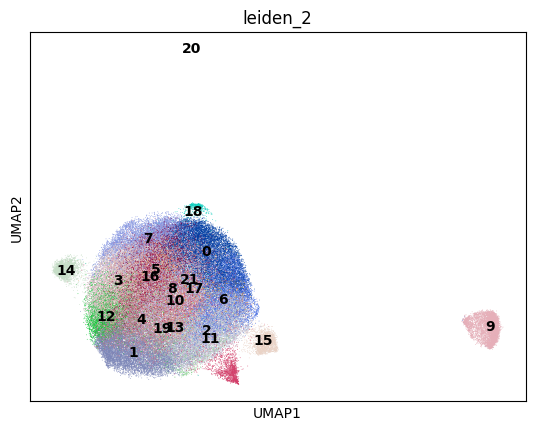

In [39]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

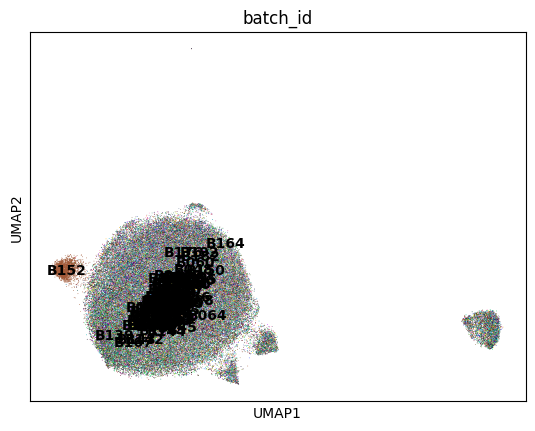

In [40]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

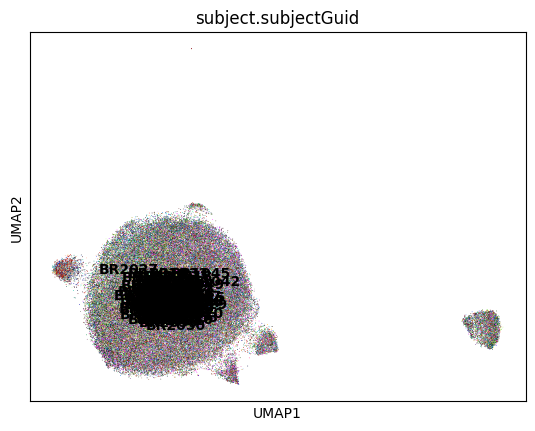

In [41]:
sc.pl.umap(adata, color = 'subject.subjectGuid', legend_loc = 'on data')

### Marker expression

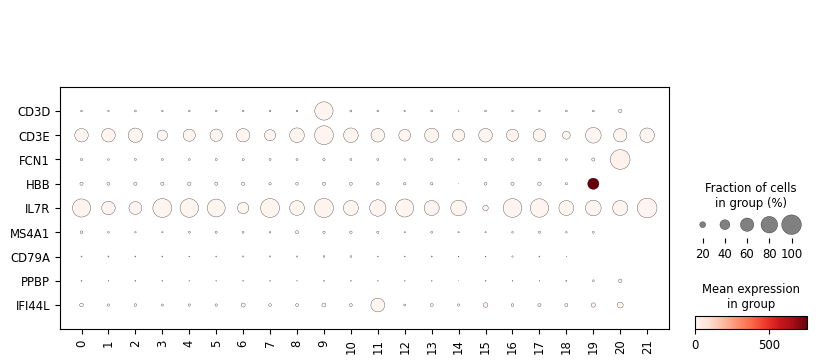

In [42]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

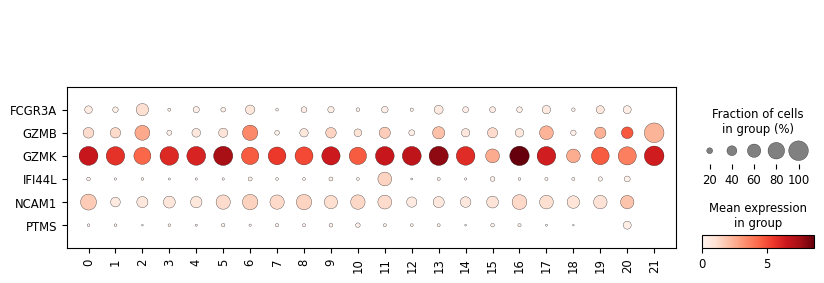

In [43]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Cluster counts

In [44]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     9109
1     9003
2     8100
3     7592
4     6763
5     6603
6     6544
7     6019
8     5847
9     5079
10    4237
11    3410
12    3362
13    2775
14    2692
15    2532
16    2163
17    1361
18     652
19      23
20      10
21       3
Name: count, dtype: int64

### Outlier investigation

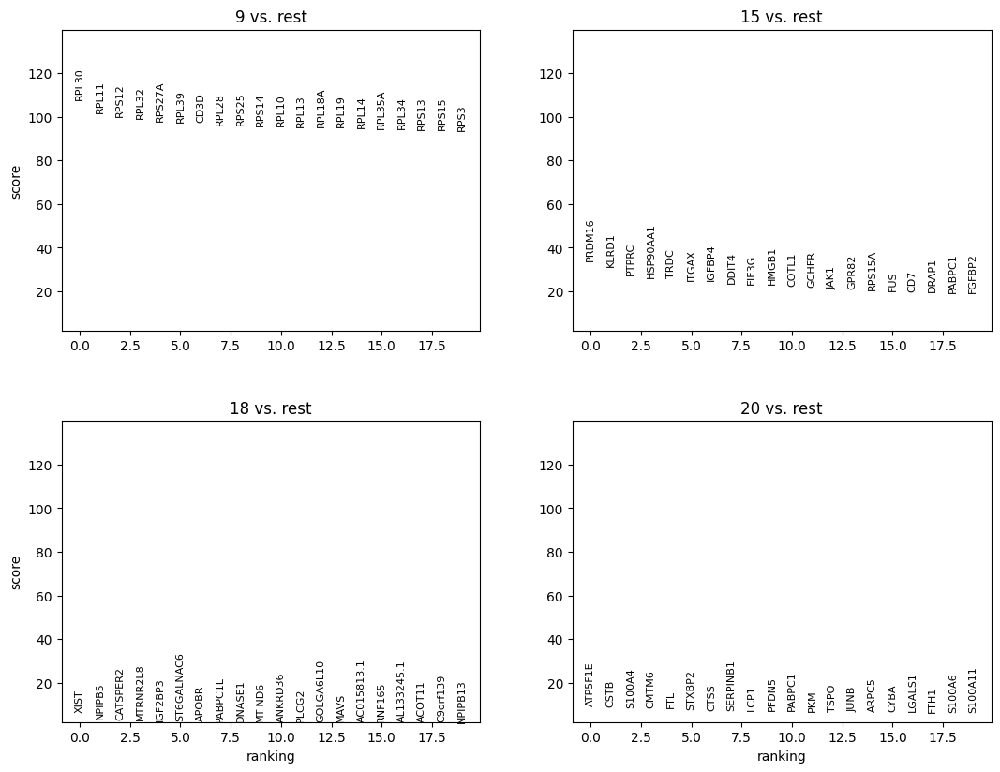

In [45]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['9','15','18','20']
)
sc.pl.rank_genes_groups(adata, ncols = 2)

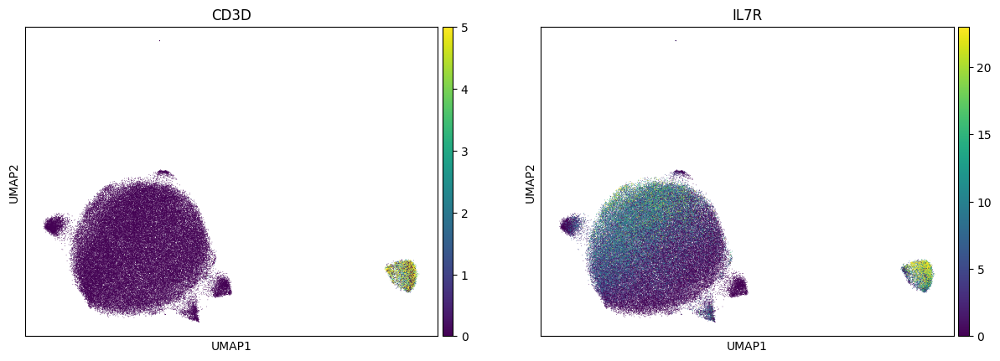

In [46]:
sc.pl.umap(adata, color = ['CD3D', 'IL7R'], vmax = 'p99', ncols = 2)

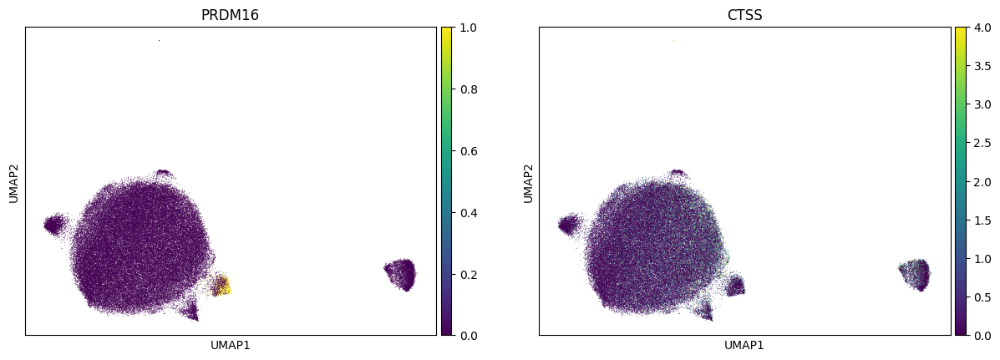

In [47]:
sc.pl.umap(adata, color = ['PRDM16','CTSS'], vmax = 'p99', ncols = 2)

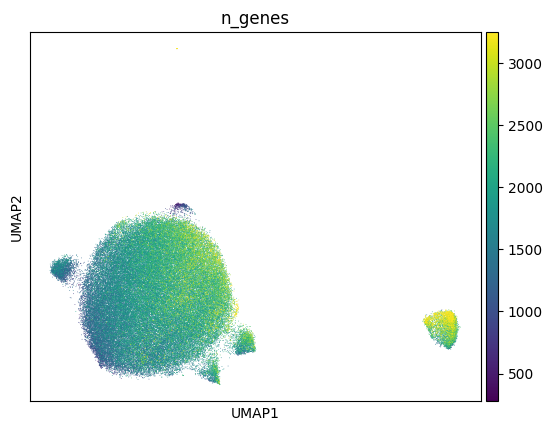

In [48]:
sc.pl.umap(adata, color = ['n_genes'], vmax = 'p99', ncols = 2)

/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)


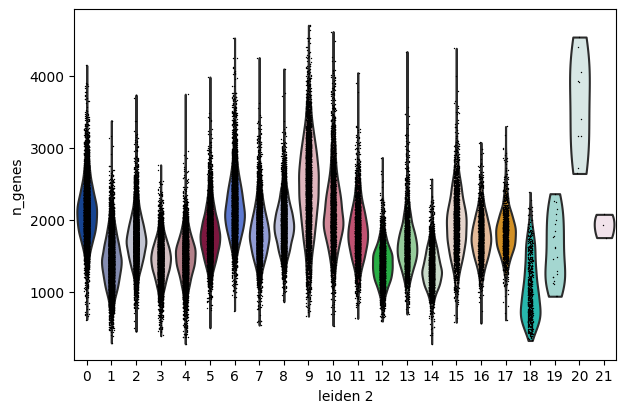

In [49]:
sc.pl.violin(adata, groupby = 'leiden_2', keys = 'n_genes')

### Comparison to original labels

In [50]:
adata = add_labels(adata, original_df)

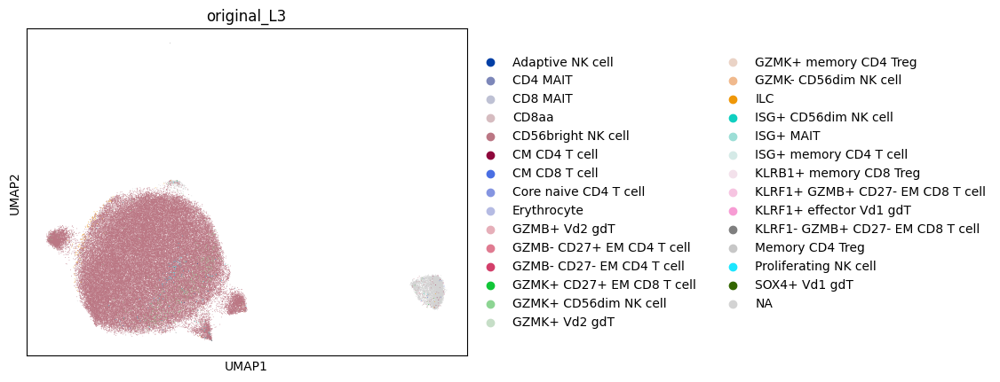

In [51]:
sc.pl.umap(adata, color = 'original_L3')

In [52]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
CD56bright NK cell                  86736
NaN                                  5936
GZMK+ CD56dim NK cell                 770
Proliferating NK cell                 152
ILC                                   119
ISG+ CD56dim NK cell                   30
GZMK+ Vd2 gdT                          29
CD8aa                                  18
GZMK- CD56dim NK cell                  16
Adaptive NK cell                       16
CM CD4 T cell                          10
GZMB+ Vd2 gdT                           9
CD8 MAIT                                6
KLRF1+ GZMB+ CD27- EM CD8 T cell        5
CM CD8 T cell                           4
GZMK+ CD27+ EM CD8 T cell               3
SOX4+ Vd1 gdT                           3
KLRF1+ effector Vd1 gdT                 3
GZMB- CD27+ EM CD4 T cell               2
Erythrocyte                             2
KLRF1- GZMB+ CD27- EM CD8 T cell        2
Memory CD4 Treg                         1
ISG+ MAIT                               1
KLRB1+ memory CD8 Treg

In [53]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
CD56bright NK cell                  0.923913
NaN                                 0.063230
GZMK+ CD56dim NK cell               0.008202
Proliferating NK cell               0.001619
ILC                                 0.001268
ISG+ CD56dim NK cell                0.000320
GZMK+ Vd2 gdT                       0.000309
CD8aa                               0.000192
GZMK- CD56dim NK cell               0.000170
Adaptive NK cell                    0.000170
CM CD4 T cell                       0.000107
GZMB+ Vd2 gdT                       0.000096
CD8 MAIT                            0.000064
KLRF1+ GZMB+ CD27- EM CD8 T cell    0.000053
CM CD8 T cell                       0.000043
GZMK+ CD27+ EM CD8 T cell           0.000032
SOX4+ Vd1 gdT                       0.000032
KLRF1+ effector Vd1 gdT             0.000032
GZMB- CD27+ EM CD4 T cell           0.000021
Erythrocyte                         0.000021
KLRF1- GZMB+ CD27- EM CD8 T cell    0.000021
Memory CD4 Treg                     0.00001

### Suggested updates

- Remove CD3D+/IL7R+ cluster (9) as T cell doublet
- Remove Low gene expression cluster (18) as low quality

## Review GZMK- CD56dim NK cell

In [54]:
cell_type = 'GZMK- CD56dim NK cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [55]:
type_uuid

'c57b1fec-d3d6-447c-8ae1-ca38be463007'

In [56]:
adata = read_adata_uuid(type_uuid)

### Clustering

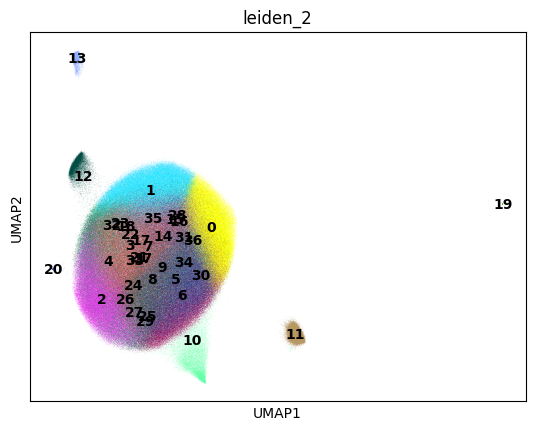

In [57]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

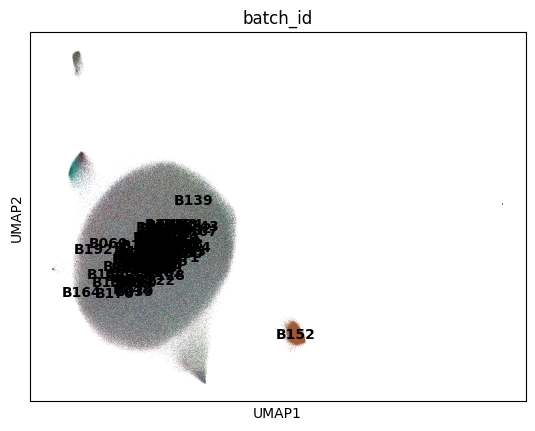

In [58]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

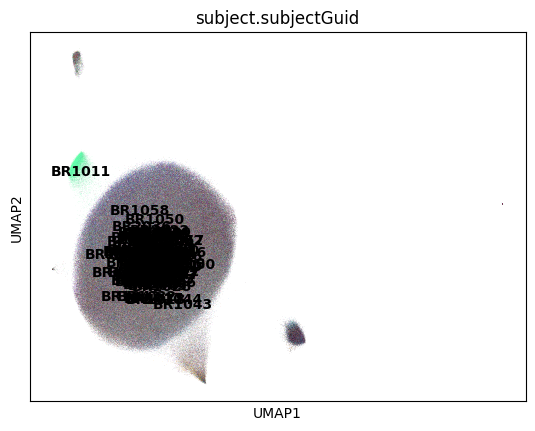

In [59]:
sc.pl.umap(adata, color = 'subject.subjectGuid', legend_loc = 'on data')

### Marker expression

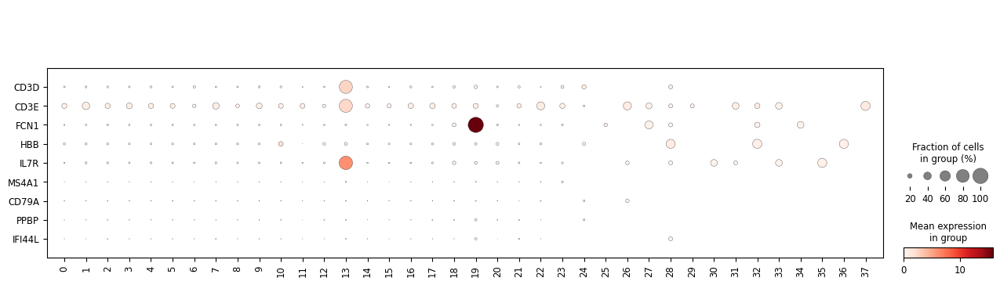

In [60]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

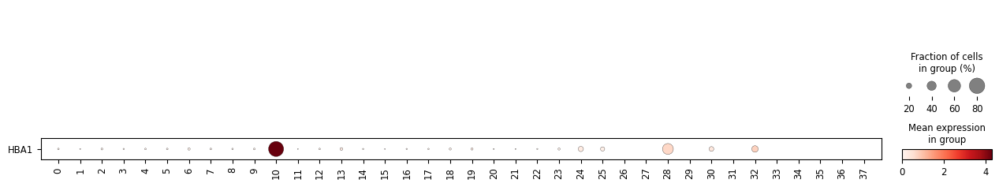

In [61]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['HBA1'], swap_axes = True)

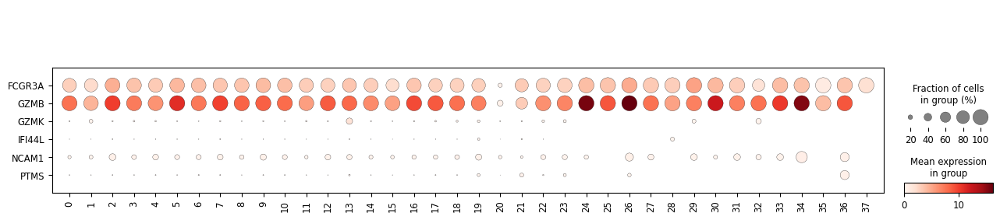

In [62]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Cluster counts

In [63]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     98749
1     90369
2     87172
3     72818
4     72656
5     70050
6     66360
7     62462
8     61245
9     52644
10    29254
11    23236
12    20929
13     7381
14     2994
15     2142
16     1003
17      924
18      606
19      520
20      256
21      142
22      116
23       17
24       16
25        7
26        7
27        7
30        6
31        6
29        6
28        6
32        4
33        3
34        3
35        2
36        2
37        2
Name: count, dtype: int64

### Outlier investigation

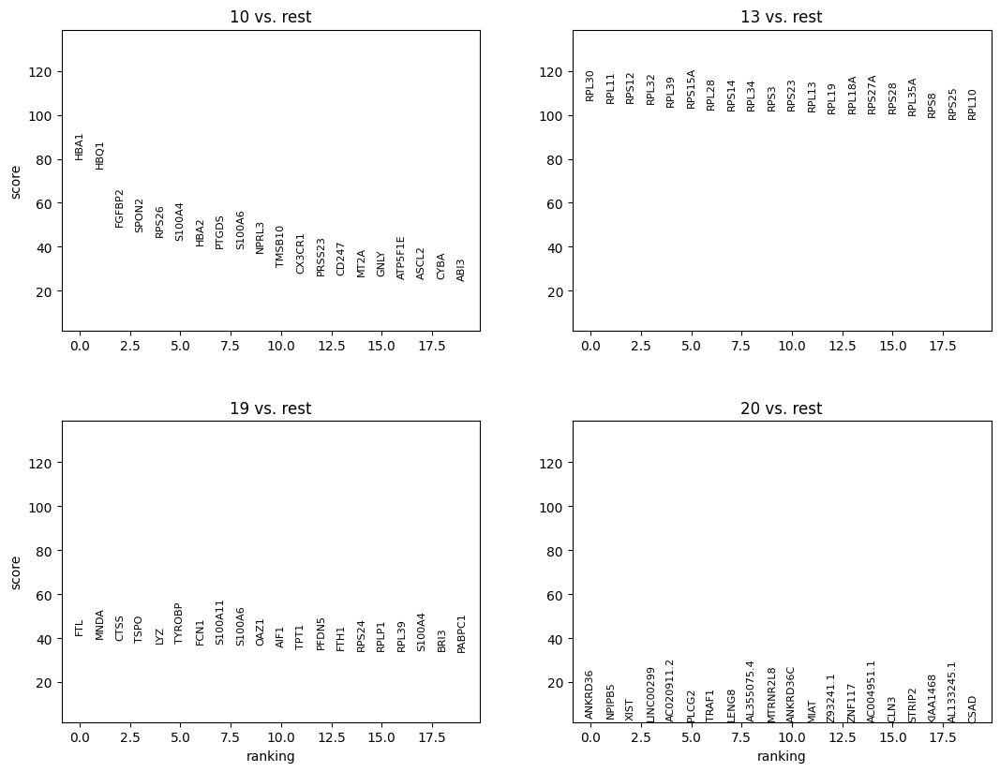

In [64]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['10','13','19','20']
)
sc.pl.rank_genes_groups(adata, ncols = 2)

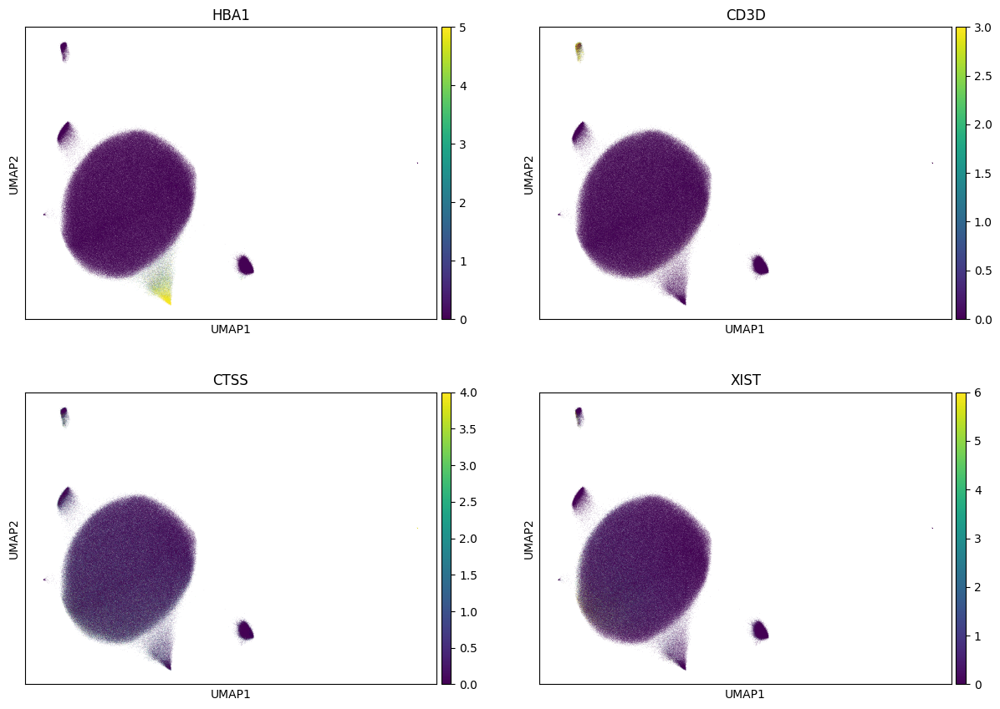

In [65]:
sc.pl.umap(adata, color = ['HBA1','CD3D','CTSS','XIST'], ncols = 2, vmax = 'p99')

### Comparison to original labels

In [66]:
adata = add_labels(adata, original_df)

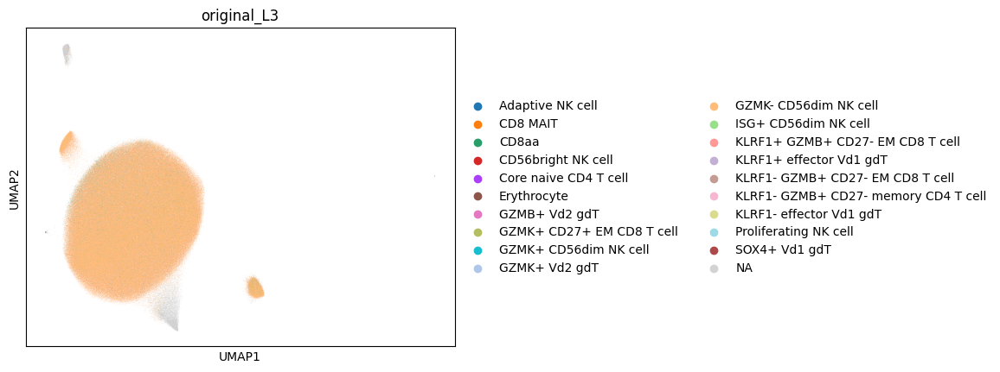

In [67]:
sc.pl.umap(adata, color = 'original_L3')

In [68]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
GZMK- CD56dim NK cell                   761707
NaN                                      47219
Adaptive NK cell                          5622
GZMK+ CD56dim NK cell                     5407
ISG+ CD56dim NK cell                      2992
Proliferating NK cell                      558
CD56bright NK cell                         229
GZMB+ Vd2 gdT                              213
KLRF1+ effector Vd1 gdT                     48
KLRF1- GZMB+ CD27- EM CD8 T cell            40
Erythrocyte                                 31
KLRF1+ GZMB+ CD27- EM CD8 T cell            30
CD8 MAIT                                     8
KLRF1- effector Vd1 gdT                      6
GZMK+ Vd2 gdT                                4
SOX4+ Vd1 gdT                                3
CD8aa                                        2
GZMK+ CD27+ EM CD8 T cell                    1
Core naive CD4 T cell                        1
KLRF1- GZMB+ CD27- memory CD4 T cell         1
Name: count, dtype: int64

In [69]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
GZMK- CD56dim NK cell                   0.924265
NaN                                     0.057296
Adaptive NK cell                        0.006822
GZMK+ CD56dim NK cell                   0.006561
ISG+ CD56dim NK cell                    0.003631
Proliferating NK cell                   0.000677
CD56bright NK cell                      0.000278
GZMB+ Vd2 gdT                           0.000258
KLRF1+ effector Vd1 gdT                 0.000058
KLRF1- GZMB+ CD27- EM CD8 T cell        0.000049
Erythrocyte                             0.000038
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.000036
CD8 MAIT                                0.000010
KLRF1- effector Vd1 gdT                 0.000007
GZMK+ Vd2 gdT                           0.000005
SOX4+ Vd1 gdT                           0.000004
CD8aa                                   0.000002
GZMK+ CD27+ EM CD8 T cell               0.000001
Core naive CD4 T cell                   0.000001
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000001
Name: co

### Suggested updates

- Remove CD3D+/IL7R+ cluster (13) as T cell doublet
- Remove HBA1+ cluster (10) as Erythrocyte doublet

## Review GZMK+ CD56dim NK cell

In [112]:
cell_type = 'GZMK+ CD56dim NK cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [113]:
type_uuid

'a680b65c-22aa-4bca-86e3-aa6ec4554072'

In [114]:
adata = read_adata_uuid(type_uuid)

downloading fileID: a680b65c-22aa-4bca-86e3-aa6ec4554072
Files have been successfully downloaded!


### Clustering

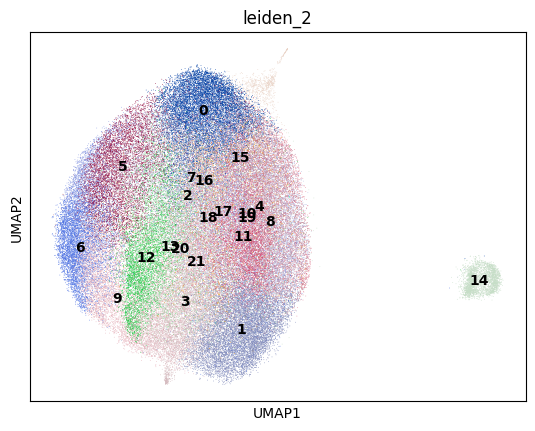

In [115]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

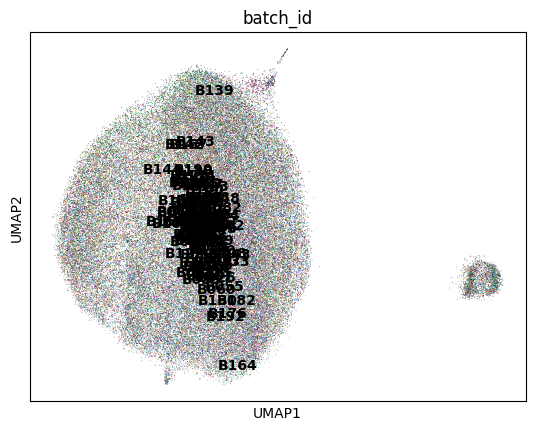

In [116]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

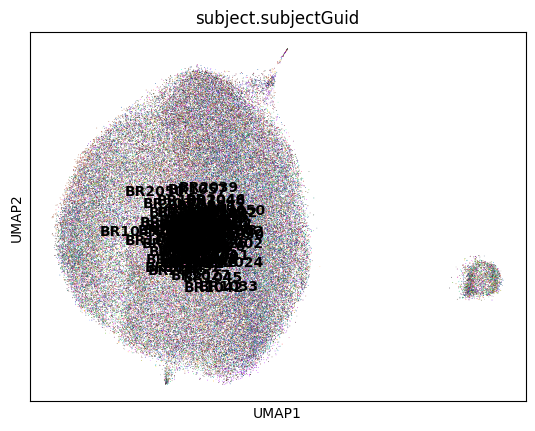

In [117]:
sc.pl.umap(adata, color = 'subject.subjectGuid', legend_loc = 'on data')

### Marker expression

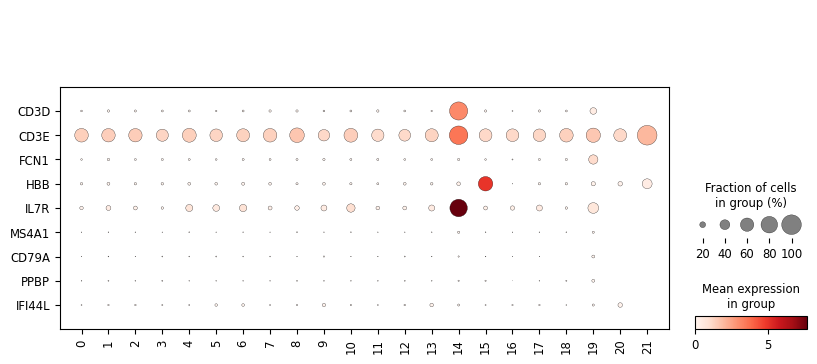

In [118]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

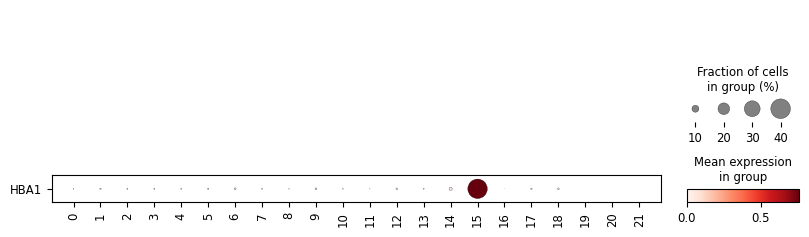

In [119]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['HBA1'], swap_axes = True)

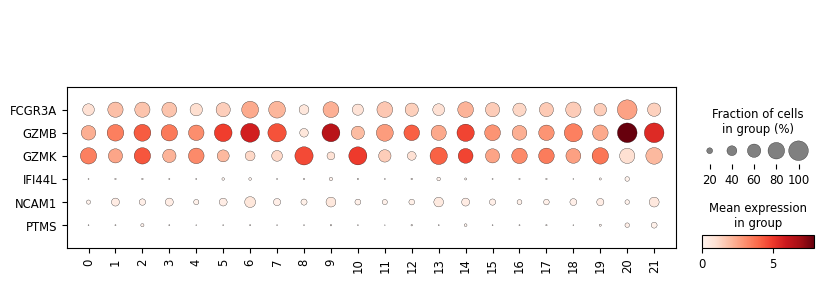

In [120]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

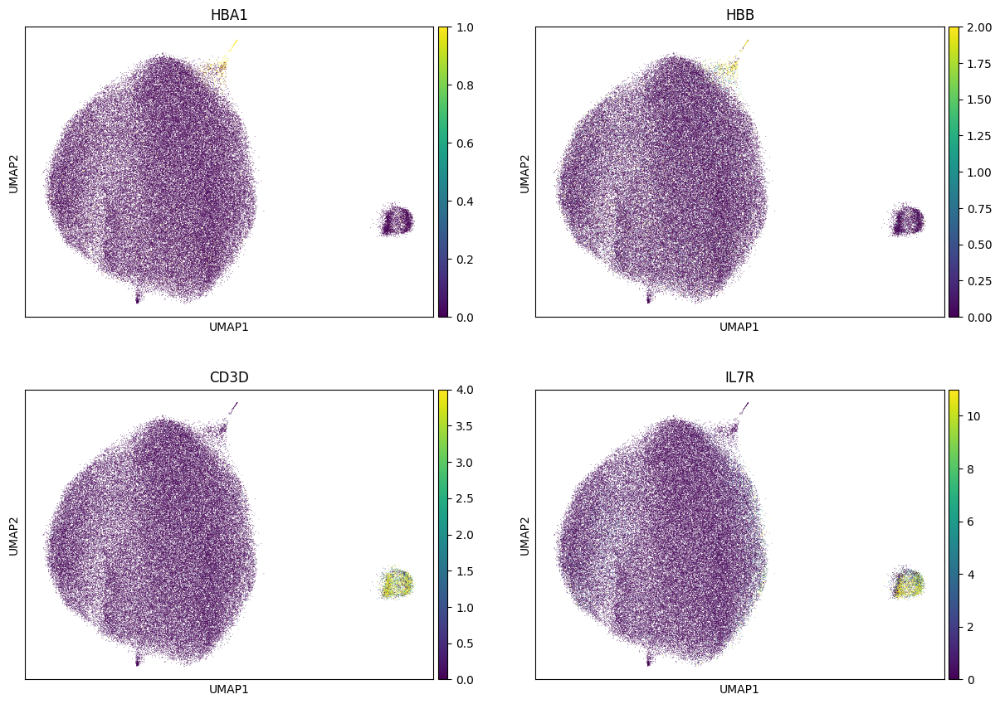

In [121]:
sc.pl.umap(adata, color = ['HBA1','HBB','CD3D','IL7R'], ncols = 2, vmax = 'p99')

### GZMK+/GZMK- boundary investigation

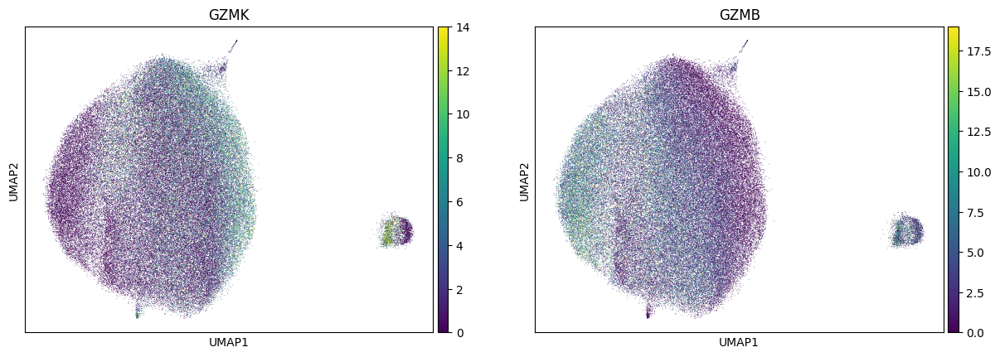

In [127]:
sc.pl.umap(adata, color = ['GZMK','GZMB'], ncols = 2, vmax = 'p99')

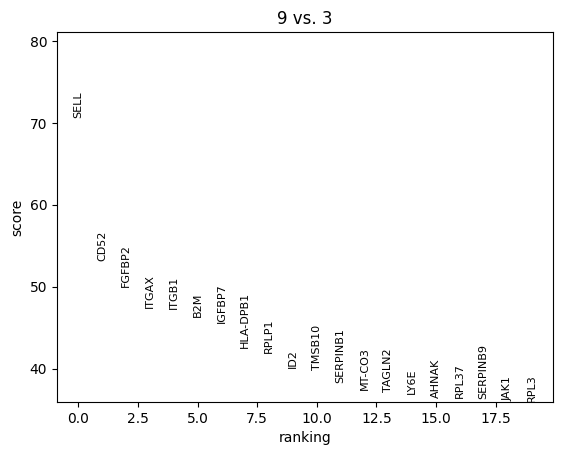

In [129]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['9'],
    reference = '3'
)
sc.pl.rank_genes_groups(adata, ncols = 2)

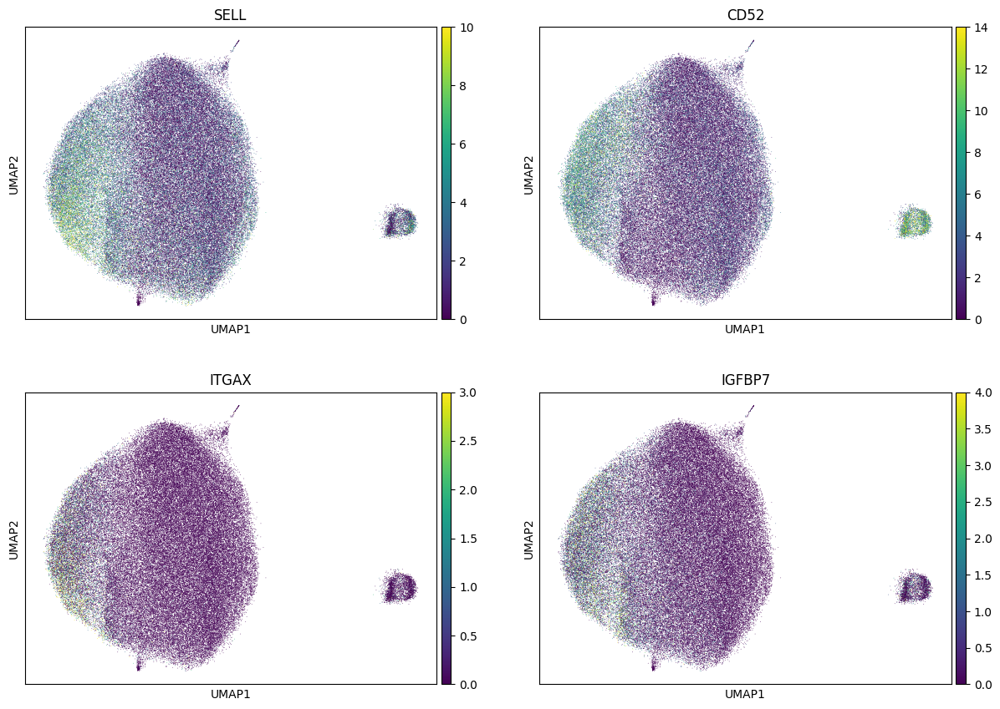

In [132]:
sc.pl.umap(adata, color = ['SELL','CD52','ITGAX','IGFBP7'], ncols = 2, vmax = 'p99')

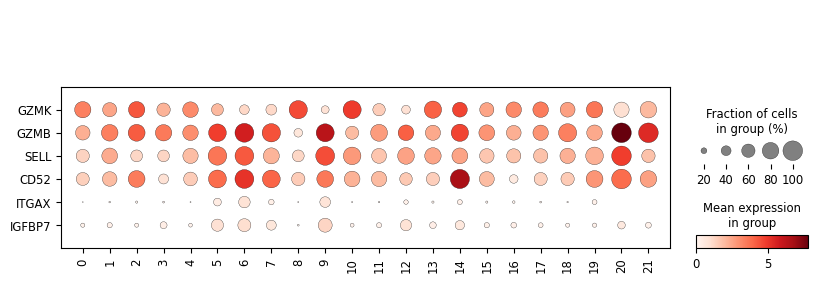

In [133]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['GZMK', 'GZMB', 'SELL', 'CD52','ITGAX','IGFBP7'], swap_axes = True)

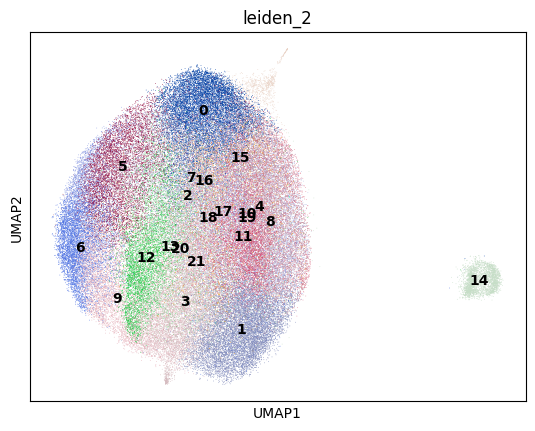

In [115]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Cluster counts

In [122]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     9735
1     9542
2     8676
3     7606
4     6877
5     6243
6     6088
7     6055
8     5926
9     5793
10    5785
11    5104
12    4759
13    3933
14    3020
15    2390
16    2010
17    1509
18     129
19      38
20       7
21       5
Name: count, dtype: int64

### Comparison to original labels

In [123]:
adata = add_labels(adata, original_df)

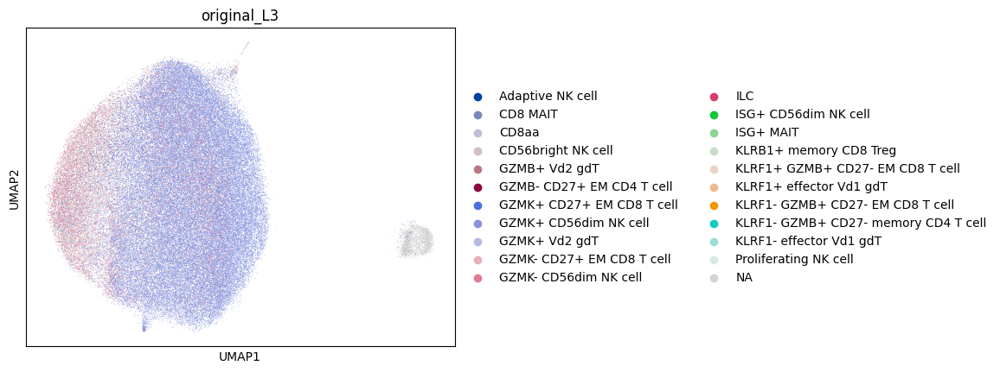

In [124]:
sc.pl.umap(adata, color = 'original_L3')

In [125]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
GZMK+ CD56dim NK cell                   71376
GZMK- CD56dim NK cell                   13622
CD56bright NK cell                      10239
NaN                                      4083
Adaptive NK cell                          894
ISG+ CD56dim NK cell                      405
GZMB+ Vd2 gdT                             233
GZMK+ Vd2 gdT                             138
Proliferating NK cell                     136
KLRF1+ GZMB+ CD27- EM CD8 T cell           41
CD8 MAIT                                   17
KLRF1- GZMB+ CD27- EM CD8 T cell           12
KLRF1+ effector Vd1 gdT                    12
KLRF1- effector Vd1 gdT                     6
CD8aa                                       5
GZMK+ CD27+ EM CD8 T cell                   3
GZMB- CD27+ EM CD4 T cell                   2
ILC                                         2
KLRF1- GZMB+ CD27- memory CD4 T cell        1
KLRB1+ memory CD8 Treg                      1
GZMK- CD27+ EM CD8 T cell                   1
ISG+ MAIT             

In [126]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
GZMK+ CD56dim NK cell                   0.705087
GZMK- CD56dim NK cell                   0.134565
CD56bright NK cell                      0.101146
NaN                                     0.040334
Adaptive NK cell                        0.008831
ISG+ CD56dim NK cell                    0.004001
GZMB+ Vd2 gdT                           0.002302
GZMK+ Vd2 gdT                           0.001363
Proliferating NK cell                   0.001343
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.000405
CD8 MAIT                                0.000168
KLRF1- GZMB+ CD27- EM CD8 T cell        0.000119
KLRF1+ effector Vd1 gdT                 0.000119
KLRF1- effector Vd1 gdT                 0.000059
CD8aa                                   0.000049
GZMK+ CD27+ EM CD8 T cell               0.000030
GZMB- CD27+ EM CD4 T cell               0.000020
ILC                                     0.000020
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000010
KLRB1+ memory CD8 Treg                  0.000010
GZMK- CD

### Suggested updates

- Remove CD3D+/IL7R+ cluster (14) as T cell doublet
- Remove HBA1+ cluster (15) as Erythrocyte doublet
- Reassign GZMK-low/ITGAX+ (CD11c+) clusters (5,6,7,9) as GZMK- CD56dim NK cell

## Review ISG+ CD56dim NK cell

In [70]:
cell_type = 'ISG+ CD56dim NK cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [71]:
type_uuid

'94ac7c14-a07c-43a1-a22b-dbc5df49aaa8'

In [72]:
adata = read_adata_uuid(type_uuid)

### Clustering

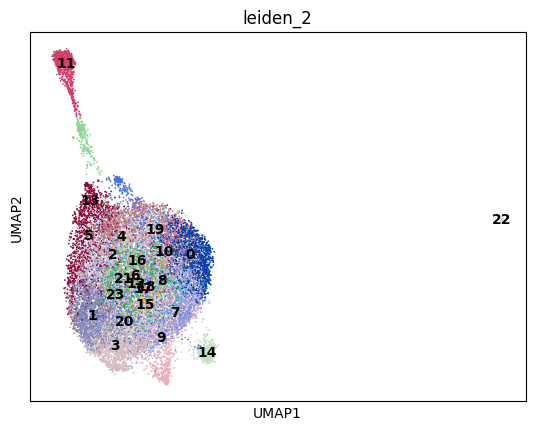

In [73]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

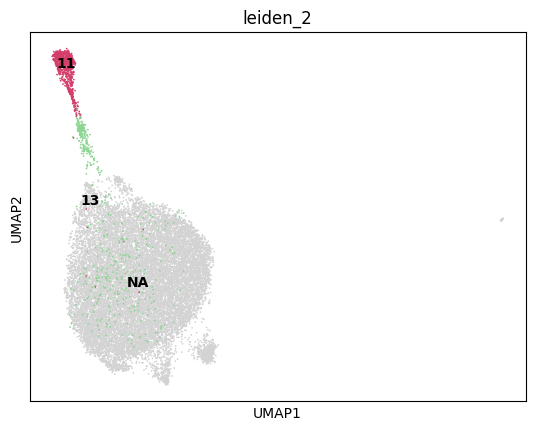

In [74]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data', groups = ['11','13'])

### Marker expression

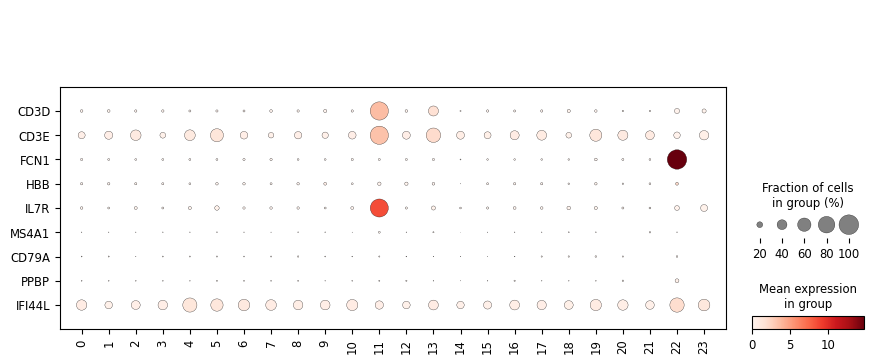

In [75]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

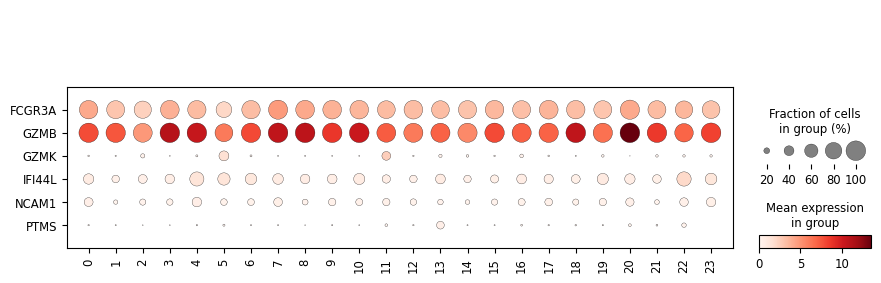

In [76]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Cluster counts

In [77]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     1706
1     1556
2     1548
3     1418
4     1383
5     1374
6     1238
7     1223
8     1118
9     1076
10     976
11     895
12     761
13     580
14     572
15     531
16     464
17     189
18     168
19     136
20     119
21      92
22      78
23      16
Name: count, dtype: int64

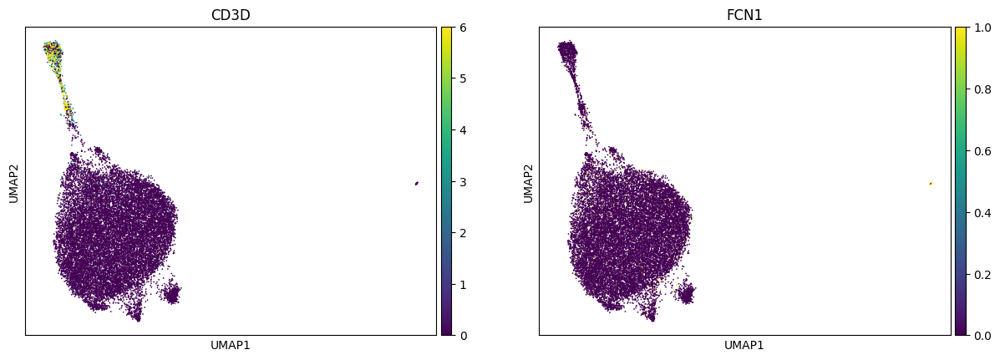

In [78]:
sc.pl.umap(adata, color = ['CD3D','FCN1'], vmax = 'p99')

### Comparison to original labels

In [79]:
adata = add_labels(adata, original_df)

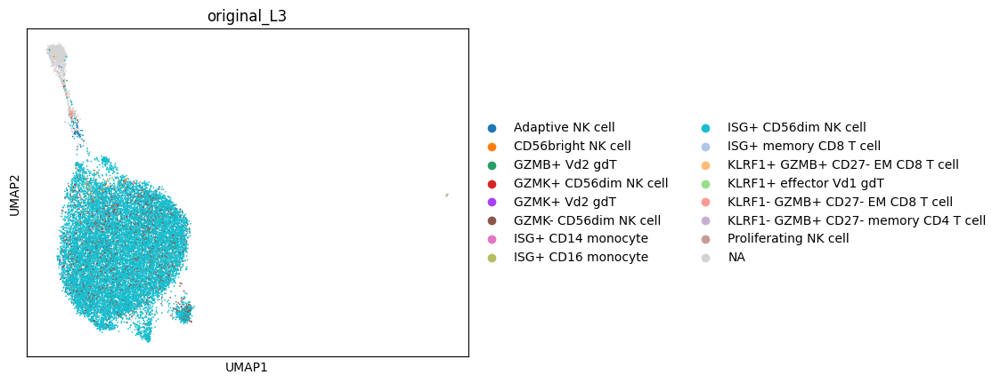

In [80]:
sc.pl.umap(adata, color = 'original_L3')

In [81]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
ISG+ CD56dim NK cell                    15829
GZMK- CD56dim NK cell                    1601
NaN                                      1362
Adaptive NK cell                          138
GZMK+ CD56dim NK cell                      96
CD56bright NK cell                         73
KLRF1- GZMB+ CD27- EM CD8 T cell           36
Proliferating NK cell                      35
GZMB+ Vd2 gdT                              17
ISG+ memory CD8 T cell                     10
KLRF1+ GZMB+ CD27- EM CD8 T cell           10
KLRF1+ effector Vd1 gdT                     6
GZMK+ Vd2 gdT                               1
ISG+ CD14 monocyte                          1
ISG+ CD16 monocyte                          1
KLRF1- GZMB+ CD27- memory CD4 T cell        1
Name: count, dtype: int64

In [82]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
ISG+ CD56dim NK cell                    0.823698
GZMK- CD56dim NK cell                   0.083312
NaN                                     0.070875
Adaptive NK cell                        0.007181
GZMK+ CD56dim NK cell                   0.004996
CD56bright NK cell                      0.003799
KLRF1- GZMB+ CD27- EM CD8 T cell        0.001873
Proliferating NK cell                   0.001821
GZMB+ Vd2 gdT                           0.000885
ISG+ memory CD8 T cell                  0.000520
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.000520
KLRF1+ effector Vd1 gdT                 0.000312
GZMK+ Vd2 gdT                           0.000052
ISG+ CD14 monocyte                      0.000052
ISG+ CD16 monocyte                      0.000052
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000052
Name: count, dtype: float64

### Suggested updates

- Remove CD3D+/IL7R+ clusters (11, 13) as T cell doublet
- Remove FCN1+ cluster (22) as Myeloid doublet

## Review Proliferating NK cell

In [83]:
cell_type = 'Proliferating NK cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [84]:
type_uuid

'4a9774c4-2141-4910-b13a-aec201b962b2'

In [85]:
adata = read_adata_uuid(type_uuid)

### Clustering

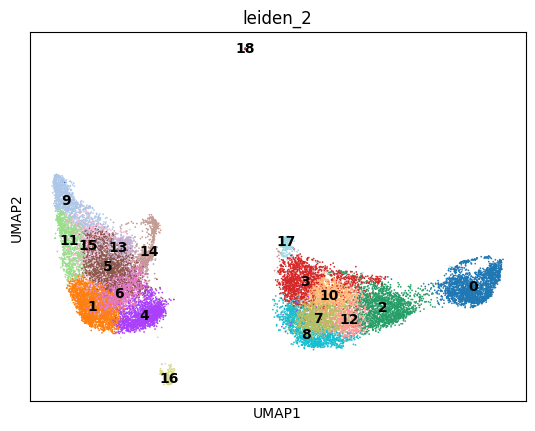

In [86]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

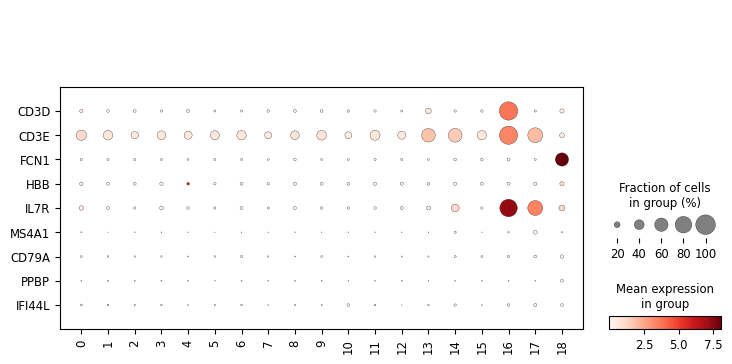

In [87]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

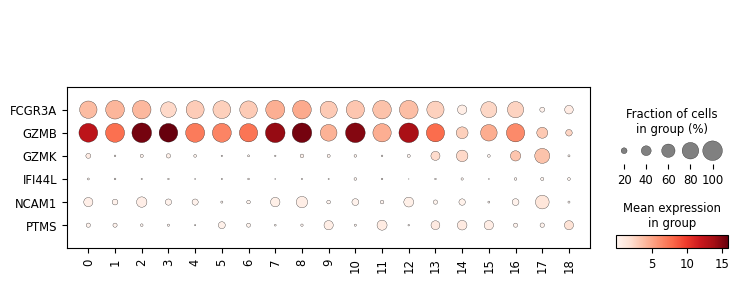

In [88]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Cluster counts

In [89]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     2079
1     1822
2     1660
3     1572
4     1461
5     1424
6     1278
7     1176
8     1119
9     1065
10    1033
11     903
12     692
13     676
14     618
15     598
16     292
17     281
18      39
Name: count, dtype: int64

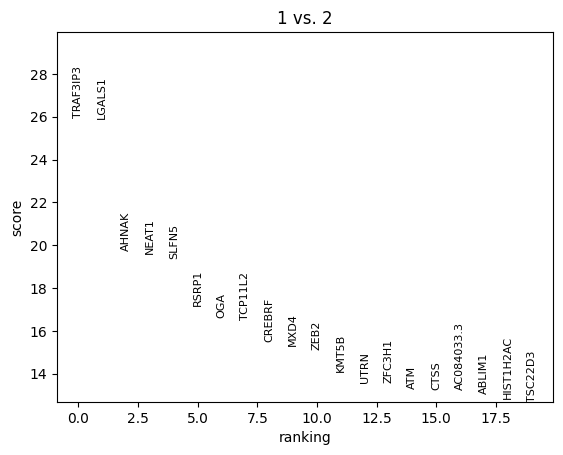

In [90]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['1'],
    reference = '2'
)
sc.pl.rank_genes_groups(adata, ncols = 2)

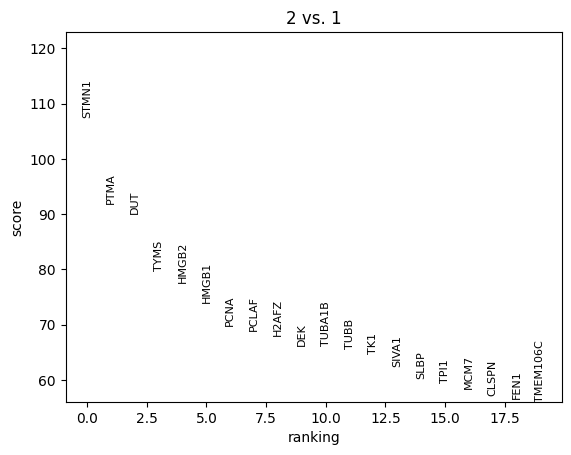

In [91]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['2'],
    reference = '1'
)
sc.pl.rank_genes_groups(adata, ncols = 2)

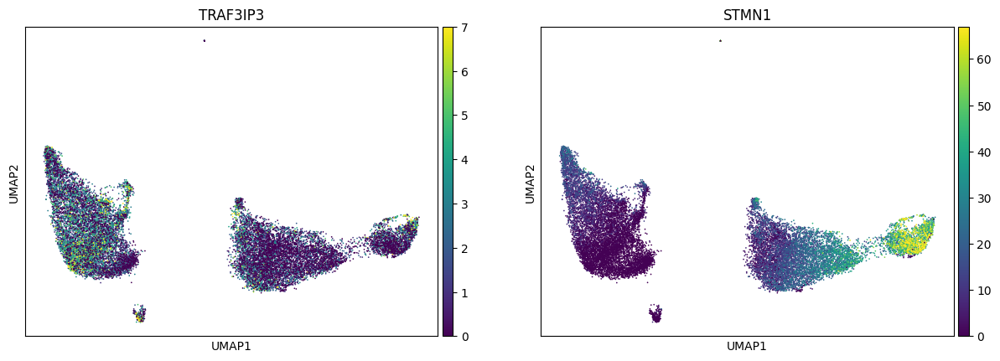

In [92]:
sc.pl.umap(adata, color = ['TRAF3IP3','STMN1'], vmax = 'p99')

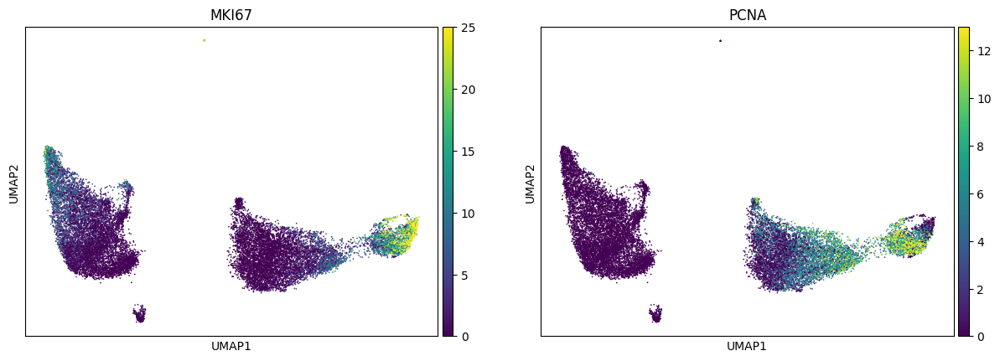

In [93]:
sc.pl.umap(adata, color = ['MKI67','PCNA'], vmax = 'p99')

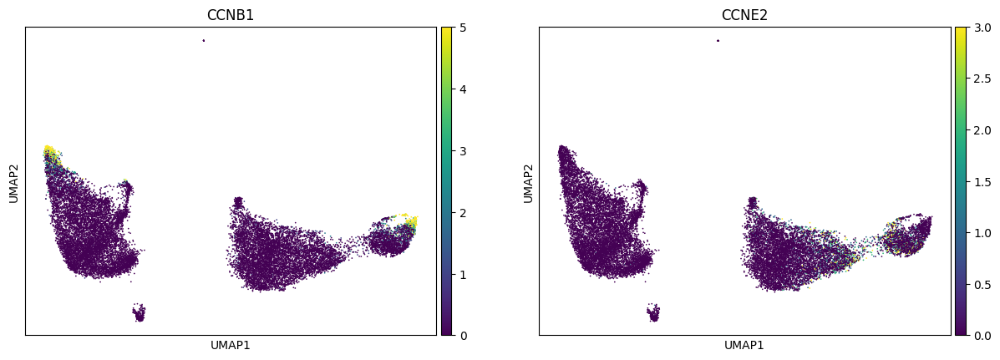

In [94]:
sc.pl.umap(adata, color = ['CCNB1','CCNE2'], vmax = 'p99')

### Comparison to original labels

In [95]:
adata = add_labels(adata, original_df)

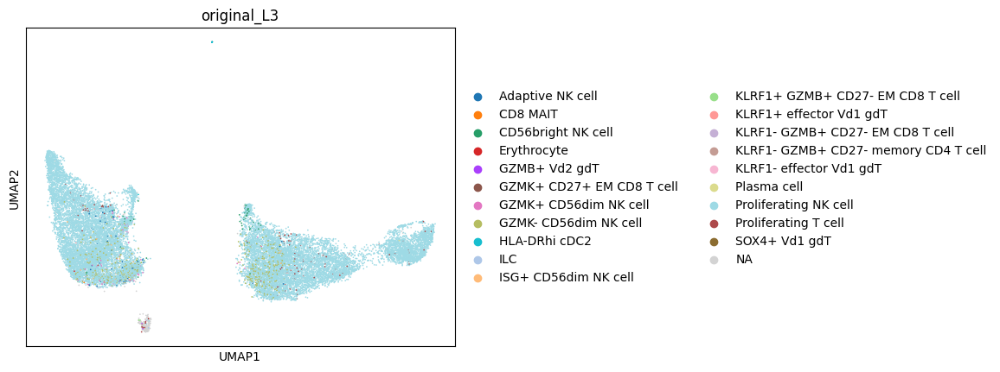

In [96]:
sc.pl.umap(adata, color = 'original_L3')

In [97]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Proliferating NK cell                   18344
GZMK- CD56dim NK cell                     507
NaN                                       449
Proliferating T cell                      159
Adaptive NK cell                          103
CD56bright NK cell                         84
GZMK+ CD56dim NK cell                      76
ISG+ CD56dim NK cell                       30
HLA-DRhi cDC2                              11
KLRF1+ effector Vd1 gdT                     6
GZMB+ Vd2 gdT                               4
KLRF1- effector Vd1 gdT                     3
ILC                                         2
KLRF1+ GZMB+ CD27- EM CD8 T cell            2
Erythrocyte                                 2
GZMK+ CD27+ EM CD8 T cell                   1
CD8 MAIT                                    1
KLRF1- GZMB+ CD27- EM CD8 T cell            1
KLRF1- GZMB+ CD27- memory CD4 T cell        1
Plasma cell                                 1
SOX4+ Vd1 gdT                               1
Name: count, dtype: in

In [98]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Proliferating NK cell                   0.927026
GZMK- CD56dim NK cell                   0.025622
NaN                                     0.022691
Proliferating T cell                    0.008035
Adaptive NK cell                        0.005205
CD56bright NK cell                      0.004245
GZMK+ CD56dim NK cell                   0.003841
ISG+ CD56dim NK cell                    0.001516
HLA-DRhi cDC2                           0.000556
KLRF1+ effector Vd1 gdT                 0.000303
GZMB+ Vd2 gdT                           0.000202
KLRF1- effector Vd1 gdT                 0.000152
ILC                                     0.000101
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.000101
Erythrocyte                             0.000101
GZMK+ CD27+ EM CD8 T cell               0.000051
CD8 MAIT                                0.000051
KLRF1- GZMB+ CD27- EM CD8 T cell        0.000051
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000051
Plasma cell                             0.000051
SOX4+ Vd

### Suggested updates

- Remove CD3D+/IL7R+ cluster (16) as T cell doublet
- Remove FCN1+ cluster (18) as Myeloid doublet

## Review ILC

In [99]:
cell_type = 'ILC'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [100]:
type_uuid

'00200b26-5172-48dc-8641-3c9749b4d338'

In [101]:
adata = read_adata_uuid(type_uuid)

### Clustering

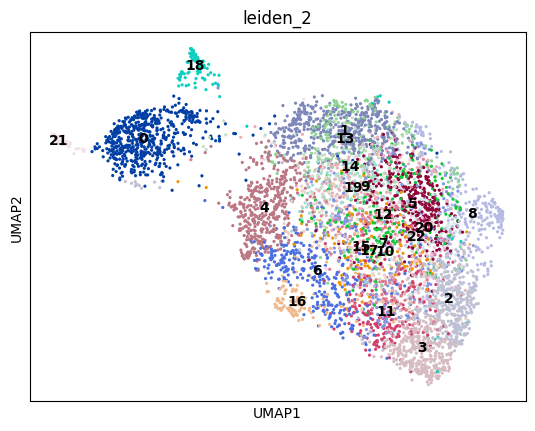

In [102]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

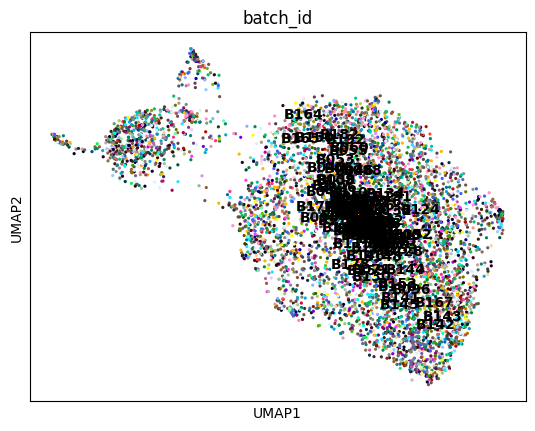

In [103]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

### Marker expression

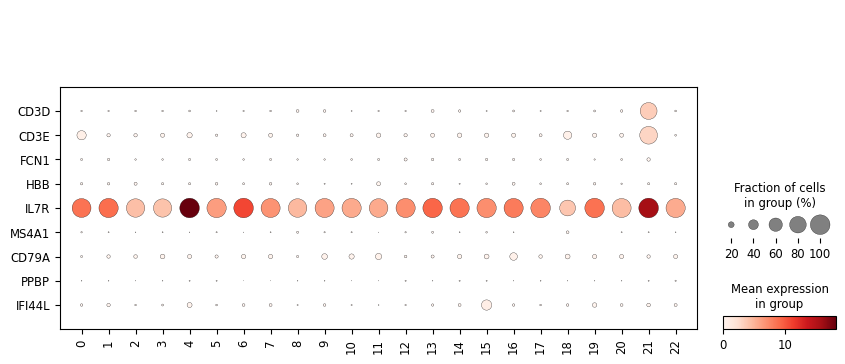

In [104]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

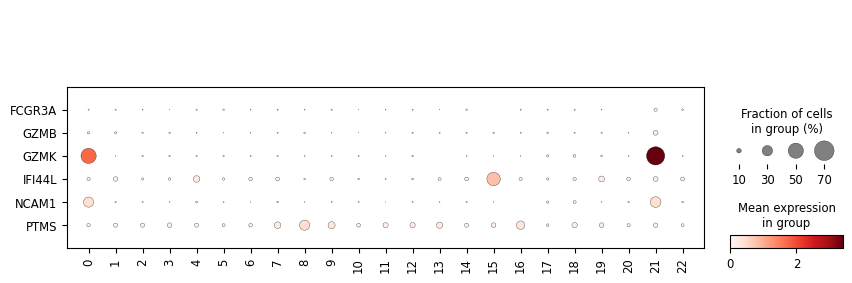

In [105]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Outlier investigation

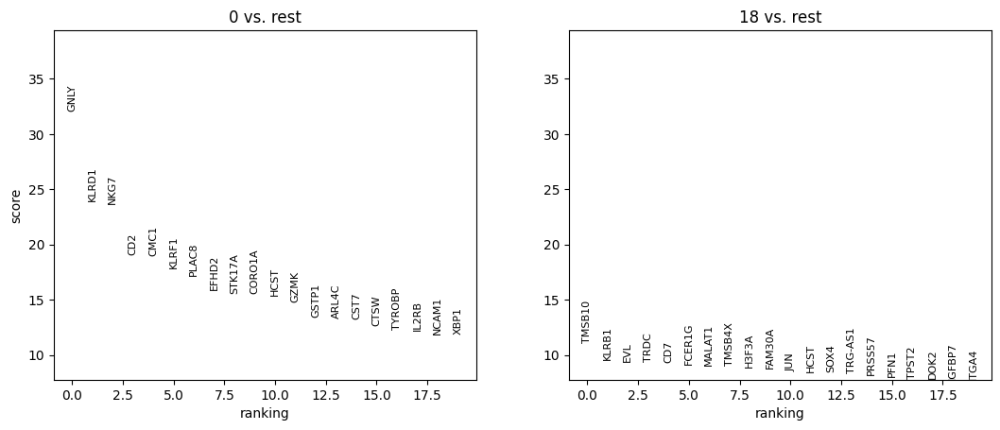

In [106]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['0','18']
)
sc.pl.rank_genes_groups(adata, ncols = 2)

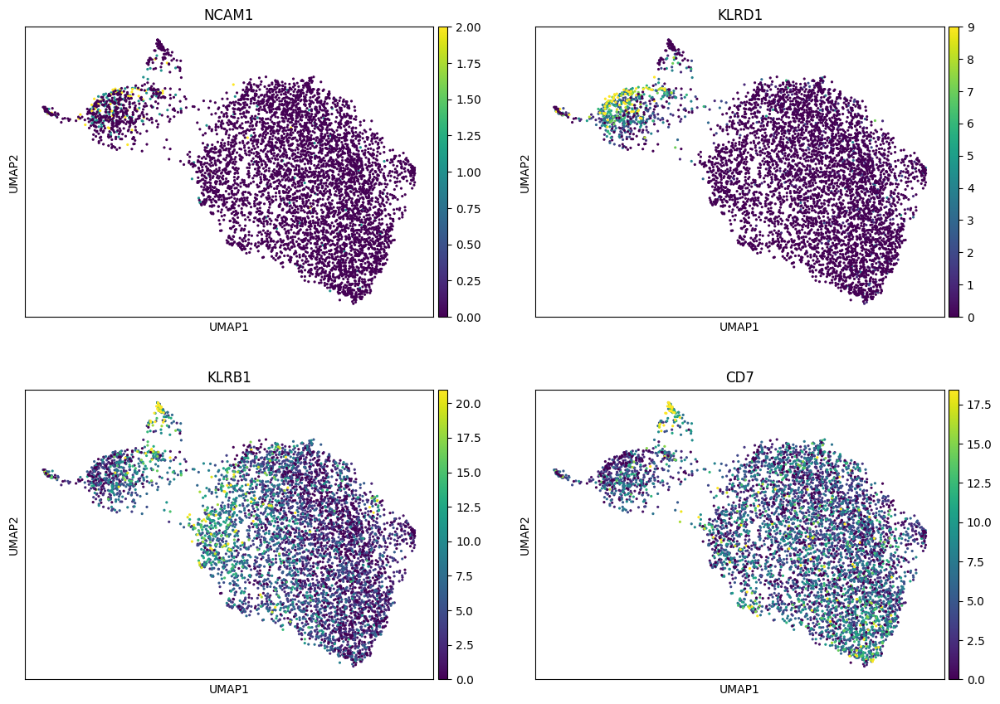

In [107]:
sc.pl.umap(adata, color = ['NCAM1', 'KLRD1', 'KLRB1', 'CD7'], vmax = 'p99', ncols = 2)

### Comparison to original labels

In [108]:
adata = add_labels(adata, original_df)

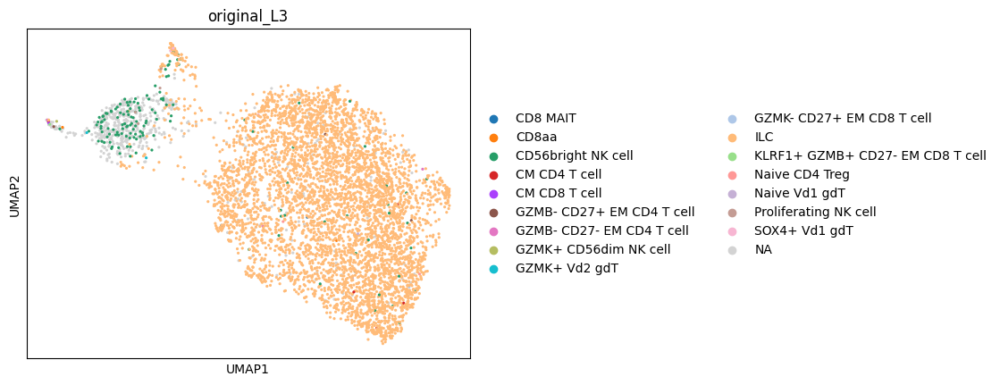

In [109]:
sc.pl.umap(adata, color = 'original_L3')

In [110]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
ILC                                 4834
NaN                                  641
CD56bright NK cell                   146
CM CD4 T cell                          5
SOX4+ Vd1 gdT                          4
GZMB- CD27- EM CD4 T cell              4
Proliferating NK cell                  4
GZMB- CD27+ EM CD4 T cell              3
Naive Vd1 gdT                          2
Naive CD4 Treg                         2
CD8 MAIT                               2
CD8aa                                  2
GZMK+ CD56dim NK cell                  2
GZMK+ Vd2 gdT                          2
KLRF1+ GZMB+ CD27- EM CD8 T cell       1
GZMK- CD27+ EM CD8 T cell              1
CM CD8 T cell                          1
Name: count, dtype: int64

In [111]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
ILC                                 0.854668
NaN                                 0.113331
CD56bright NK cell                  0.025813
CM CD4 T cell                       0.000884
SOX4+ Vd1 gdT                       0.000707
GZMB- CD27- EM CD4 T cell           0.000707
Proliferating NK cell               0.000707
GZMB- CD27+ EM CD4 T cell           0.000530
Naive Vd1 gdT                       0.000354
Naive CD4 Treg                      0.000354
CD8 MAIT                            0.000354
CD8aa                               0.000354
GZMK+ CD56dim NK cell               0.000354
GZMK+ Vd2 gdT                       0.000354
KLRF1+ GZMB+ CD27- EM CD8 T cell    0.000177
GZMK- CD27+ EM CD8 T cell           0.000177
CM CD8 T cell                       0.000177
Name: count, dtype: float64

### Suggested updates

- Remove CD3D+/IL7R+ cluster (21) as T cell doublet
- Reassign NCAM1+/KLRD1+ cluster (0) as CD56bright NK cell